# Preprocessing and Integration of Individual Libraries

### 1. Import Required Packages 
### 2. Import All Libraries (scAR Output)
### 3. Print QC Plots - Pre-Filtering
### 4. Data Filtering
### 5. Print QC Plots - Post-Processing
### 6. Label Transfer Celltypes from Seurat Analysis of TC snRNAseq data
### 7. Doublet Detection using Scrublet
### 8. Data Normalization


## <br> 1. Import Required Packages

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import anndata as ad
import scrublet as scr

from scvi.model.utils import mde
from scar import setup_anndata
from scar import model
from scipy import sparse
from anndata import AnnData
from anndata.experimental.multi_files import AnnCollection

[rank: 0] Global seed set to 0


Set figure parameters.

In [2]:
sc.set_figure_params(figsize=(4,4))
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'
pd.options.display.max_colwidth = 100

## <br> 2. Import All Libraries

In [3]:
L001 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L001_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L002 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L002_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L003 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L003_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L016 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L016_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L018 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L018_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L019 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L019_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L021 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L021_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L022 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L022B_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L023 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L023_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L036 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L036_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L038 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L038B_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L039 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L039_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L041 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L041_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L042 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L042_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L043 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L043_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L056 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L056_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L057 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L057_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L058 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L058B_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L062 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L062_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L063 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L063_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L064 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L064_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L077 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L077_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L078 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L078B_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L079 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L079_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L081 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L081_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L082 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L082_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L083 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L083B_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L096 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L096_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L097 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L097_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L098 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L098_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L101 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L101_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L102 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L102_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L103 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L103_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L116 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L116_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L117 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L117_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L118 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L118_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L121 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L121B_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L122 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L122_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L123 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L123_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L136 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L136_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L137 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L137_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  
L138 = sc.read_10x_mtx('/mnt/research/zacharewski_lab/Gio_Space/snRNAseq_copies/L138B_outs/filtered_feature_bc_matrix',var_names='gene_symbols',cache=True)  

In [4]:
print(L001)
print(L002)
print(L003)
print(L016)
print(L018)
print(L019)
print(L021)
print(L022)
print(L023)
print(L036)
print(L038)
print(L039)
print(L041)
print(L042)
print(L043)
print(L056)
print(L057)
print(L058)
print(L062)
print(L063)
print(L064)
print(L077)
print(L078)
print(L079)
print(L081)
print(L082)
print(L083)
print(L096)
print(L097)
print(L098)
print(L101)
print(L102)
print(L103)
print(L116)
print(L117)
print(L118)
print(L121)
print(L122)
print(L123)
print(L136)
print(L137)
print(L138 )

AnnData object with n_obs × n_vars = 4694 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 6022 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 6078 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 4348 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 4338 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 7191 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 4646 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 11346 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 7896 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 8737 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 9815 × 32285
    var: 'gene_ids', 'feature_types'
AnnData object with n_obs × n_vars = 4992 

Annotate the Dose for each library.

In [5]:
L001.obs['Dose'] = '0'
L002.obs['Dose'] = '0'
L003.obs['Dose'] = '0'
L016.obs['Dose'] = '30'
L018.obs['Dose'] = '30'
L019.obs['Dose'] = '30'
L021.obs['Dose'] = '0'
L022.obs['Dose'] = '0'
L023.obs['Dose'] = '0'
L036.obs['Dose'] = '30'
L038.obs['Dose'] = '30'
L039.obs['Dose'] = '30'
L041.obs['Dose'] = '0'
L042.obs['Dose'] = '0'
L043.obs['Dose'] = '0'
L056.obs['Dose'] = '30'
L057.obs['Dose'] = '30'
L058.obs['Dose'] = '30'
L062.obs['Dose'] = '0'
L063.obs['Dose'] = '0'
L064.obs['Dose'] = '0'
L077.obs['Dose'] = '30'
L078.obs['Dose'] = '30'
L079.obs['Dose'] = '30'
L081.obs['Dose'] = '0'
L082.obs['Dose'] = '0'
L083.obs['Dose'] = '0'
L096.obs['Dose'] = '30'
L097.obs['Dose'] = '30'
L098.obs['Dose'] = '30'
L101.obs['Dose'] = '0'
L102.obs['Dose'] = '0'
L103.obs['Dose'] = '0'
L116.obs['Dose'] = '30'
L117.obs['Dose'] = '30'
L118.obs['Dose'] = '30'
L121.obs['Dose'] = '0'
L122.obs['Dose'] = '0'
L123.obs['Dose'] = '0'
L136.obs['Dose'] = '30'
L137.obs['Dose'] = '30'
L138.obs['Dose'] = '30'

Annotate the Time for each library.

In [6]:
L001.obs['Time'] = '2'
L002.obs['Time'] = '2'
L003.obs['Time'] = '2'
L016.obs['Time'] = '2'
L018.obs['Time'] = '2'
L019.obs['Time'] = '2'
L021.obs['Time'] = '4'
L022.obs['Time'] = '4'
L023.obs['Time'] = '4'
L036.obs['Time'] = '4'
L038.obs['Time'] = '4'
L039.obs['Time'] = '4'
L041.obs['Time'] = '8'
L042.obs['Time'] = '8'
L043.obs['Time'] = '8'
L056.obs['Time'] = '8'
L057.obs['Time'] = '8'
L058.obs['Time'] = '8'
L062.obs['Time'] = '12'
L063.obs['Time'] = '12'
L064.obs['Time'] = '12'
L077.obs['Time'] = '12'
L078.obs['Time'] = '12'
L079.obs['Time'] = '12'
L081.obs['Time'] = '18'
L082.obs['Time'] = '18'
L083.obs['Time'] = '18'
L096.obs['Time'] = '18'
L097.obs['Time'] = '18'
L098.obs['Time'] = '18'
L101.obs['Time'] = '24'
L102.obs['Time'] = '24'
L103.obs['Time'] = '24'
L116.obs['Time'] = '24'
L117.obs['Time'] = '24'
L118.obs['Time'] = '24'
L121.obs['Time'] = '72'
L122.obs['Time'] = '72'
L123.obs['Time'] = '72'
L136.obs['Time'] = '72'
L137.obs['Time'] = '72'
L138.obs['Time'] = '72'

Annotate the Original Identification for each library

In [7]:
L001.obs['OrigIdent'] = 'L001'
L002.obs['OrigIdent'] = 'L002'
L003.obs['OrigIdent'] = 'L003'
L016.obs['OrigIdent'] = 'L016'
L018.obs['OrigIdent'] = 'L018'
L019.obs['OrigIdent'] = 'L019'
L021.obs['OrigIdent'] = 'L021'
L022.obs['OrigIdent'] = 'L022'
L023.obs['OrigIdent'] = 'L023'
L036.obs['OrigIdent'] = 'L036'
L038.obs['OrigIdent'] = 'L038'
L039.obs['OrigIdent'] = 'L039'
L041.obs['OrigIdent'] = 'L041'
L042.obs['OrigIdent'] = 'L042'
L043.obs['OrigIdent'] = 'L043'
L056.obs['OrigIdent'] = 'L056'
L057.obs['OrigIdent'] = 'L057'
L058.obs['OrigIdent'] = 'L058'
L062.obs['OrigIdent'] = 'L062'
L063.obs['OrigIdent'] = 'L063'
L064.obs['OrigIdent'] = 'L064'
L077.obs['OrigIdent'] = 'L077'
L078.obs['OrigIdent'] = 'L078'
L079.obs['OrigIdent'] = 'L079'
L081.obs['OrigIdent'] = 'L081'
L082.obs['OrigIdent'] = 'L082'
L083.obs['OrigIdent'] = 'L083'
L096.obs['OrigIdent'] = 'L096'
L097.obs['OrigIdent'] = 'L097'
L098.obs['OrigIdent'] = 'L098'
L101.obs['OrigIdent'] = 'L101'
L102.obs['OrigIdent'] = 'L102'
L103.obs['OrigIdent'] = 'L103'
L116.obs['OrigIdent'] = 'L116'
L117.obs['OrigIdent'] = 'L117'
L118.obs['OrigIdent'] = 'L118'
L121.obs['OrigIdent'] = 'L121'
L122.obs['OrigIdent'] = 'L122'
L123.obs['OrigIdent'] = 'L123'
L136.obs['OrigIdent'] = 'L136'
L137.obs['OrigIdent'] = 'L137'
L138.obs['OrigIdent'] = 'L138'

Find mitochondrial genes

In [8]:
L001.var['mt'] = L001.var_names.str.startswith('mt-')
L002.var['mt'] = L002.var_names.str.startswith('mt-')
L003.var['mt'] = L003.var_names.str.startswith('mt-')
L016.var['mt'] = L016.var_names.str.startswith('mt-')
L018.var['mt'] = L018.var_names.str.startswith('mt-')
L019.var['mt'] = L019.var_names.str.startswith('mt-')
L021.var['mt'] = L021.var_names.str.startswith('mt-')
L022.var['mt'] = L022.var_names.str.startswith('mt-')
L023.var['mt'] = L023.var_names.str.startswith('mt-')
L036.var['mt'] = L036.var_names.str.startswith('mt-')
L038.var['mt'] = L038.var_names.str.startswith('mt-')
L039.var['mt'] = L039.var_names.str.startswith('mt-')
L041.var['mt'] = L041.var_names.str.startswith('mt-')
L042.var['mt'] = L042.var_names.str.startswith('mt-')
L043.var['mt'] = L043.var_names.str.startswith('mt-')
L056.var['mt'] = L056.var_names.str.startswith('mt-')
L057.var['mt'] = L057.var_names.str.startswith('mt-')
L058.var['mt'] = L058.var_names.str.startswith('mt-')
L062.var['mt'] = L062.var_names.str.startswith('mt-')
L063.var['mt'] = L063.var_names.str.startswith('mt-')
L064.var['mt'] = L064.var_names.str.startswith('mt-')
L077.var['mt'] = L077.var_names.str.startswith('mt-')
L078.var['mt'] = L078.var_names.str.startswith('mt-')
L079.var['mt'] = L079.var_names.str.startswith('mt-')
L081.var['mt'] = L081.var_names.str.startswith('mt-')
L082.var['mt'] = L082.var_names.str.startswith('mt-')
L083.var['mt'] = L083.var_names.str.startswith('mt-')
L096.var['mt'] = L096.var_names.str.startswith('mt-')
L097.var['mt'] = L097.var_names.str.startswith('mt-')
L098.var['mt'] = L098.var_names.str.startswith('mt-')
L101.var['mt'] = L101.var_names.str.startswith('mt-')
L102.var['mt'] = L102.var_names.str.startswith('mt-')
L103.var['mt'] = L103.var_names.str.startswith('mt-')
L116.var['mt'] = L116.var_names.str.startswith('mt-')
L117.var['mt'] = L117.var_names.str.startswith('mt-')
L118.var['mt'] = L118.var_names.str.startswith('mt-')
L121.var['mt'] = L121.var_names.str.startswith('mt-')
L122.var['mt'] = L122.var_names.str.startswith('mt-')
L123.var['mt'] = L123.var_names.str.startswith('mt-')
L136.var['mt'] = L136.var_names.str.startswith('mt-')
L137.var['mt'] = L137.var_names.str.startswith('mt-')
L138.var['mt'] = L138.var_names.str.startswith('mt-')

Calculate stats for prevalence of mitochondrial genes

In [9]:
sc.pp.calculate_qc_metrics(L001, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L002, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L003, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L016, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L018, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L019, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L021, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L022, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L023, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L036, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L038, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L039, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L041, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L042, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L043, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L056, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L057, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L058, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L062, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L063, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L064, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L077, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L078, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L079, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L081, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L082, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L083, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L096, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L097, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L098, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L101, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L102, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L103, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L116, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L117, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L118, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L121, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L122, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L123, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L136, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L137, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(L138, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

Concatonate all AnnData objects into single file and normalize data (this is just for prefiltering plots right now)...will repeat this step later on once data is fully filtered.

In [10]:
adata = ad.concat([L001, L002, L003, L016, 
                       L018, L019, L021, L022, 
                       L023, L036, L038, L039, 
                       L041, L042, L043, L056, 
                       L057, L058, L062, L063, 
                       L064, L077, L078, L079, 
                       L081, L082, L083, L096, 
                       L097, L098, L101, L102, 
                       L103, L116, L117, L118, 
                       L121, L122, L123, L136, 
                       L137, L138],
                  join="outer",
                  index_unique='-')

In [11]:
print(adata)

AnnData object with n_obs × n_vars = 268783 × 32285
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'


# <br> 3. Print QC Plots - Pre-Filtering

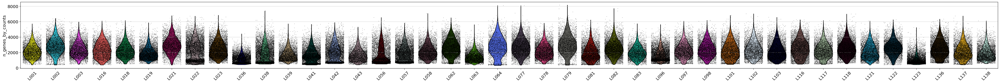

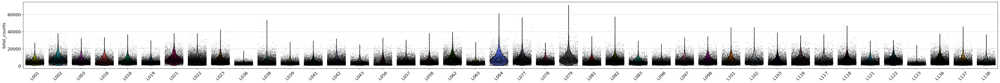

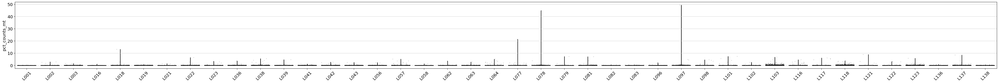

In [12]:
sc.set_figure_params(figsize=(42,4))

sc.pl.violin(adata, ['n_genes_by_counts'],
             jitter=0.4, 
             groupby = 'OrigIdent', 
             rotation= 45,
             save='_n_genes_by_counts_PreFiltering.pdf'
            )

sc.pl.violin(adata, ['total_counts'],
             jitter=0.4, 
             groupby = 'OrigIdent', 
             rotation= 45,
             save='_total_counts_PreFiltering.pdf'
            )

sc.pl.violin(adata, ['pct_counts_mt'],
             jitter=0.4, 
             groupby = 'OrigIdent', 
             rotation= 45,
             save='_pct_counts_mt_PreFiltering.pdf'
            )

# <br> 4. Data Filtering

Remove cells that have <100 genes. 

In [13]:
sc.pp.filter_cells(L001, min_genes=100)
sc.pp.filter_cells(L002, min_genes=100)
sc.pp.filter_cells(L003, min_genes=100)
sc.pp.filter_cells(L016, min_genes=100)
sc.pp.filter_cells(L018, min_genes=100)
sc.pp.filter_cells(L019, min_genes=100)
sc.pp.filter_cells(L021, min_genes=100)
sc.pp.filter_cells(L022, min_genes=100)
sc.pp.filter_cells(L023, min_genes=100)
sc.pp.filter_cells(L036, min_genes=100)
sc.pp.filter_cells(L038, min_genes=100)
sc.pp.filter_cells(L039, min_genes=100)
sc.pp.filter_cells(L041, min_genes=100)
sc.pp.filter_cells(L042, min_genes=100)
sc.pp.filter_cells(L043, min_genes=100)
sc.pp.filter_cells(L056, min_genes=100)
sc.pp.filter_cells(L057, min_genes=100)
sc.pp.filter_cells(L058, min_genes=100)
sc.pp.filter_cells(L062, min_genes=100)
sc.pp.filter_cells(L063, min_genes=100)
sc.pp.filter_cells(L064, min_genes=100)
sc.pp.filter_cells(L077, min_genes=100)
sc.pp.filter_cells(L078, min_genes=100)
sc.pp.filter_cells(L079, min_genes=100)
sc.pp.filter_cells(L081, min_genes=100)
sc.pp.filter_cells(L082, min_genes=100)
sc.pp.filter_cells(L083, min_genes=100)
sc.pp.filter_cells(L096, min_genes=100)
sc.pp.filter_cells(L097, min_genes=100)
sc.pp.filter_cells(L098, min_genes=100)
sc.pp.filter_cells(L101, min_genes=100)
sc.pp.filter_cells(L102, min_genes=100)
sc.pp.filter_cells(L103, min_genes=100)
sc.pp.filter_cells(L116, min_genes=100)
sc.pp.filter_cells(L117, min_genes=100)
sc.pp.filter_cells(L118, min_genes=100)
sc.pp.filter_cells(L121, min_genes=100)
sc.pp.filter_cells(L122, min_genes=100)
sc.pp.filter_cells(L123, min_genes=100)
sc.pp.filter_cells(L136, min_genes=100)
sc.pp.filter_cells(L137, min_genes=100)
sc.pp.filter_cells(L138, min_genes=100)

In [14]:
print(L001)
print(L002)
print(L003)
print(L016)
print(L018)
print(L019)
print(L021)
print(L022)
print(L023)
print(L036)
print(L038)
print(L039)
print(L041)
print(L042)
print(L043)
print(L056)
print(L057)
print(L058)
print(L062)
print(L063)
print(L064)
print(L077)
print(L078)
print(L079)
print(L081)
print(L082)
print(L083)
print(L096)
print(L097)
print(L098)
print(L101)
print(L102)
print(L103)
print(L116)
print(L117)
print(L118)
print(L121)
print(L122)
print(L123)
print(L136)
print(L137)
print(L138 )

AnnData object with n_obs × n_vars = 4694 × 32285
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
AnnData object with n_obs × n_vars = 6022 × 32285
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
AnnData object with n_obs × n_vars = 6078 × 32285
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
AnnData object with n_obs × n_vars = 4348 × 32285
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 't

Remove genes expressed in <3 cells.

In [15]:
sc.pp.filter_genes(L001, min_cells=3)
sc.pp.filter_genes(L002, min_cells=3)
sc.pp.filter_genes(L003, min_cells=3)
sc.pp.filter_genes(L016, min_cells=3)
sc.pp.filter_genes(L018, min_cells=3)
sc.pp.filter_genes(L019, min_cells=3)
sc.pp.filter_genes(L021, min_cells=3)
sc.pp.filter_genes(L022, min_cells=3)
sc.pp.filter_genes(L023, min_cells=3)
sc.pp.filter_genes(L036, min_cells=3)
sc.pp.filter_genes(L038, min_cells=3)
sc.pp.filter_genes(L039, min_cells=3)
sc.pp.filter_genes(L041, min_cells=3)
sc.pp.filter_genes(L042, min_cells=3)
sc.pp.filter_genes(L043, min_cells=3)
sc.pp.filter_genes(L056, min_cells=3)
sc.pp.filter_genes(L057, min_cells=3)
sc.pp.filter_genes(L058, min_cells=3)
sc.pp.filter_genes(L062, min_cells=3)
sc.pp.filter_genes(L063, min_cells=3)
sc.pp.filter_genes(L064, min_cells=3)
sc.pp.filter_genes(L077, min_cells=3)
sc.pp.filter_genes(L078, min_cells=3)
sc.pp.filter_genes(L079, min_cells=3)
sc.pp.filter_genes(L081, min_cells=3)
sc.pp.filter_genes(L082, min_cells=3)
sc.pp.filter_genes(L083, min_cells=3)
sc.pp.filter_genes(L096, min_cells=3)
sc.pp.filter_genes(L097, min_cells=3)
sc.pp.filter_genes(L098, min_cells=3)
sc.pp.filter_genes(L101, min_cells=3)
sc.pp.filter_genes(L102, min_cells=3)
sc.pp.filter_genes(L103, min_cells=3)
sc.pp.filter_genes(L116, min_cells=3)
sc.pp.filter_genes(L117, min_cells=3)
sc.pp.filter_genes(L118, min_cells=3)
sc.pp.filter_genes(L121, min_cells=3)
sc.pp.filter_genes(L122, min_cells=3)
sc.pp.filter_genes(L123, min_cells=3)
sc.pp.filter_genes(L136, min_cells=3)
sc.pp.filter_genes(L137, min_cells=3)
sc.pp.filter_genes(L138, min_cells=3)

In [16]:
print(L001)
print(L002)
print(L003)
print(L016)
print(L018)
print(L019)
print(L021)
print(L022)
print(L023)
print(L036)
print(L038)
print(L039)
print(L041)
print(L042)
print(L043)
print(L056)
print(L057)
print(L058)
print(L062)
print(L063)
print(L064)
print(L077)
print(L078)
print(L079)
print(L081)
print(L082)
print(L083)
print(L096)
print(L097)
print(L098)
print(L101)
print(L102)
print(L103)
print(L116)
print(L117)
print(L118)
print(L121)
print(L122)
print(L123)
print(L136)
print(L137)
print(L138)

AnnData object with n_obs × n_vars = 4694 × 18109
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
AnnData object with n_obs × n_vars = 6022 × 19994
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
AnnData object with n_obs × n_vars = 6078 × 19390
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
AnnData object with n_obs × n_vars = 4348 × 18365
    obs: 'Dose', 'Time', 'OrigIdent', 'n_gen

Remove cells that have greater than 1% of mitochondrial DNA

In [17]:
L001 = L001[L001.obs['pct_counts_mt'] < 1, :]
L002 = L002[L002.obs['pct_counts_mt'] < 1, :]
L003 = L003[L003.obs['pct_counts_mt'] < 1, :]
L016 = L016[L016.obs['pct_counts_mt'] < 1, :]
L018 = L018[L018.obs['pct_counts_mt'] < 1, :]
L019 = L019[L019.obs['pct_counts_mt'] < 1, :]
L021 = L021[L021.obs['pct_counts_mt'] < 1, :]
L022 = L022[L022.obs['pct_counts_mt'] < 1, :]
L023 = L023[L023.obs['pct_counts_mt'] < 1, :]
L036 = L036[L036.obs['pct_counts_mt'] < 1, :]
L038 = L038[L038.obs['pct_counts_mt'] < 1, :]
L039 = L039[L039.obs['pct_counts_mt'] < 1, :]
L041 = L041[L041.obs['pct_counts_mt'] < 1, :]
L042 = L042[L042.obs['pct_counts_mt'] < 1, :]
L043 = L043[L043.obs['pct_counts_mt'] < 1, :]
L056 = L056[L056.obs['pct_counts_mt'] < 1, :]
L057 = L057[L057.obs['pct_counts_mt'] < 1, :]
L058 = L058[L058.obs['pct_counts_mt'] < 1, :]
L062 = L062[L062.obs['pct_counts_mt'] < 1, :]
L063 = L063[L063.obs['pct_counts_mt'] < 1, :]
L064 = L064[L064.obs['pct_counts_mt'] < 1, :]
L077 = L077[L077.obs['pct_counts_mt'] < 1, :]
L078 = L078[L078.obs['pct_counts_mt'] < 1, :]
L079 = L079[L079.obs['pct_counts_mt'] < 1, :]
L081 = L081[L081.obs['pct_counts_mt'] < 1, :]
L082 = L082[L082.obs['pct_counts_mt'] < 1, :]
L083 = L083[L083.obs['pct_counts_mt'] < 1, :]
L096 = L096[L096.obs['pct_counts_mt'] < 1, :]
L097 = L097[L097.obs['pct_counts_mt'] < 1, :]
L098 = L098[L098.obs['pct_counts_mt'] < 1, :]
L101 = L101[L101.obs['pct_counts_mt'] < 1, :]
L102 = L102[L102.obs['pct_counts_mt'] < 1, :]
L103 = L103[L103.obs['pct_counts_mt'] < 1, :]
L116 = L116[L116.obs['pct_counts_mt'] < 1, :]
L117 = L117[L117.obs['pct_counts_mt'] < 1, :]
L118 = L118[L118.obs['pct_counts_mt'] < 1, :]
L121 = L121[L121.obs['pct_counts_mt'] < 1, :]
L122 = L122[L122.obs['pct_counts_mt'] < 1, :]
L123 = L123[L123.obs['pct_counts_mt'] < 1, :]
L136 = L136[L136.obs['pct_counts_mt'] < 1, :]
L137 = L137[L137.obs['pct_counts_mt'] < 1, :]
L138 = L138[L138.obs['pct_counts_mt'] < 1, :]

In [18]:
print(L001)
print(L002)
print(L003)
print(L016)
print(L018)
print(L019)
print(L021)
print(L022)
print(L023)
print(L036)
print(L038)
print(L039)
print(L041)
print(L042)
print(L043)
print(L056)
print(L057)
print(L058)
print(L062)
print(L063)
print(L064)
print(L077)
print(L078)
print(L079)
print(L081)
print(L082)
print(L083)
print(L096)
print(L097)
print(L098)
print(L101)
print(L102)
print(L103)
print(L116)
print(L117)
print(L118)
print(L121)
print(L122)
print(L123)
print(L136)
print(L137)
print(L138)

View of AnnData object with n_obs × n_vars = 4694 × 18109
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
View of AnnData object with n_obs × n_vars = 6019 × 19994
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
View of AnnData object with n_obs × n_vars = 6076 × 19390
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
View of AnnData object with n_obs × n_vars = 4347 × 18365
    obs: 'Do

## Dataset concatenation

Concatonate all AnnData objects into single file and normalize data

In [19]:
adata = ad.concat([L001, L002, L003, L016, 
                       L018, L019, L021, L022, 
                       L023, L036, L038, L039, 
                       L041, L042, L043, L056, 
                       L057, L058, L062, L063, 
                       L064, L077, L078, L079, 
                       L081, L082, L083, L096, 
                       L097, L098, L101, L102, 
                       L103, L116, L117, L118, 
                       L121, L122, L123, L136, 
                       L137, L138],
                  join="outer",
                 index_unique='-')

Add barcode metadata as it's own column

In [20]:
adata.obs['Barcode'] = [x.split("-")[0] for x in adata.obs.index]
adata.obs['OrigIdent-Barcode'] = adata.obs['OrigIdent'].astype('object') + "-" + adata.obs['Barcode']

In [21]:
print(adata)

AnnData object with n_obs × n_vars = 268566 × 22917
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'Barcode', 'OrigIdent-Barcode'


# <br> 5. Print QC Plots - Post-Processing

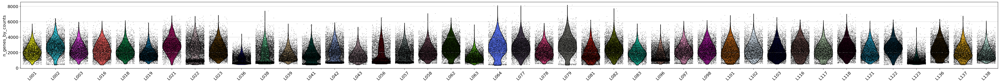

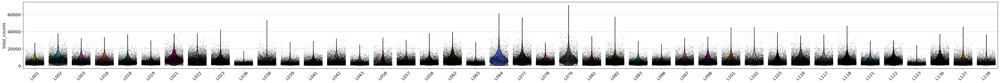

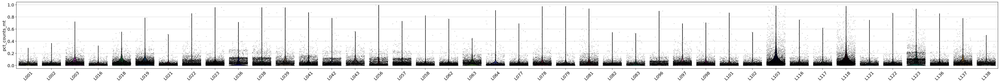

In [22]:
sc.set_figure_params(figsize=(42,4))
sc.pl.violin(adata, ['n_genes_by_counts'],
             jitter=0.4, 
             groupby = 'OrigIdent', 
             rotation= 45,
             save='_n_genes_by_counts_PostFiltering.pdf'
            )

sc.pl.violin(adata, ['total_counts'],
             jitter=0.4, 
             groupby = 'OrigIdent', 
             rotation= 45,
             save='_total_counts_PostFiltering.pdf'
            )

sc.pl.violin(adata, ['pct_counts_mt'],
             jitter=0.4, 
             groupby = 'OrigIdent', 
             rotation= 45,
             save='_pct_counts_mt_PostFiltering.pdf'
            )

# <br> 6. Label Transfer Celltypes from Seurat Analysis of TC snRNAseq data

Import celltype annotations from seurat and restructure data. 

In [23]:
annotations = pd.read_csv("../99_Seurat_Data/metadata.tsv", sep='\t', index_col=0)
annotations['Barcode'] = [x.split("-")[0] for x in annotations.index]
annotations['OrigIdent-Barcode'] = annotations['orig.ident'].astype('object') + "-" + annotations['Barcode']
annotations_mini = annotations[['OrigIdent-Barcode', 'celltype']]
annotations_mini = annotations_mini.rename(columns={"celltype": "Seurat_Celltype"})

/tmp/local/15882042/ipykernel_34067/3576639373.py:1: DtypeWarning: Columns (20,21,25,26,28,29,31,32,34,35,37,38,40,41,43,44,46,48,49,51,52,54,55,57,58,60,61,63,64,66,67,69,70,72,73,75,77,78,80,81,83,85,86,88,89,91,92,94,95,97,98,100,101,102,104,106,107,109,110,112,113,115,116,118,119,121,122,125,126,128,130,132,133) have mixed types. Specify dtype option on import or set low_memory=False.
  annotations = pd.read_csv("../99_Seurat_Data/metadata.tsv", sep='\t', index_col=0)


### ID Transfer from TC Seurat Analysis

In [24]:
adata.obs = pd.merge(adata.obs, annotations_mini, on=['OrigIdent-Barcode'], how='left')

/mnt/home/cholicog/miniconda3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:782: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


In [25]:
print(adata)

AnnData object with n_obs × n_vars = 268566 × 22917
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'Barcode', 'OrigIdent-Barcode', 'Seurat_Celltype'
    uns: 'OrigIdent_colors'


# <br> 7. Doublet Detection using Scrublet

Make sure raw count data is stored in .raw state for Scrublet Doublet Detection.

In [26]:
adata.raw = adata  # freeze the state in `.raw`

Scrublet requires batch metadata to be catagorical. 

In [27]:
adata.obs['OrigIdent'] = adata.obs['OrigIdent'].astype("category")

Run Scrublet to determine probably doublets

In [28]:
adata.obs.index = adata.obs.index.astype(str)

In [29]:
# split per batch into new objects.
batches = adata.obs['OrigIdent'].cat.categories.tolist()
alldata = {}
for batch in batches:
    tmp = adata[adata.obs['OrigIdent'] == batch,]
    print(batch, ":", tmp.shape[0], " cells")
    scrub = scr.Scrublet(tmp.raw.X)
    out = scrub.scrub_doublets(verbose=True, n_prin_comps = 20)
    alldata[batch] = pd.DataFrame({'doublet_score':out[0],'predicted_doublets':out[1]},index = tmp.obs.index)
    print(alldata[batch].predicted_doublets.sum(), " predicted_doublets")

L001 : 4694  cells
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.71
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 0.6%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 13.6%
Elapsed time: 5.6 seconds
4  predicted_doublets
L002 : 6019  cells
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.39
Detected doublet rate = 2.0%
Estimated detectable doublet fraction = 30.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 6.5%
Elapsed time: 8.5 seconds
118  predicted_doublets
L003 : 6076  cells
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.39
Detected doublet rate = 2.9%
Estimated detectable doublet fraction = 31.8%
Overall doublet ra

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.49
Detected doublet rate = 1.2%
Estimated detectable doublet fraction = 19.7%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 6.2%
Elapsed time: 4.5 seconds
43  predicted_doublets
L081 : 6692  cells
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.29
Detected doublet rate = 5.2%
Estimated detectable doublet fraction = 45.6%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 11.5%
Elapsed time: 7.8 seconds
350  predicted_doublets
L082 : 7588  cells
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.36
Detected doublet rate = 3.1%
Estimated detectable doublet fraction = 29.7%
Overall doublet rate:
	Expected   =

Add predictions to the adata object.

In [30]:
scrub_pred = pd.concat(alldata.values())
adata.obs['doublet_scores'] = scrub_pred['doublet_score'] 
adata.obs['predicted_doublets'] = scrub_pred['predicted_doublets'] 

sum(adata.obs['predicted_doublets'])

5492

Add in column with singlet/doublet instead of True/False

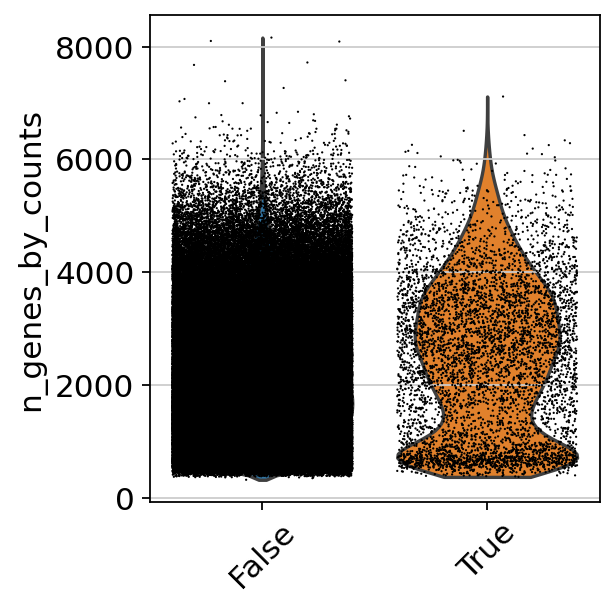

In [31]:
%matplotlib inline

adata.obs['doublet_info'] = adata.obs["predicted_doublets"].astype(str)

sc.set_figure_params(figsize=(4,4))
sc.pl.violin(adata, 'n_genes_by_counts',
             jitter=0.4, groupby = 'doublet_info', rotation=45)

In [32]:
# also revert back to the raw counts as the main matrix in adata
adata = adata.raw.to_adata() 

adata = adata[adata.obs['doublet_info'] == 'False',:]
print(adata.shape)

(263074, 22917)


In [33]:
print(adata)

View of AnnData object with n_obs × n_vars = 263074 × 22917
    obs: 'Dose', 'Time', 'OrigIdent', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'Barcode', 'OrigIdent-Barcode', 'Seurat_Celltype', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    uns: 'OrigIdent_colors', 'doublet_info_colors'


<br> <br><br>Save AnnData Object Pre-Normalized

In [34]:
adata.write_h5ad('./Adata_Objects/01a_integrated_libraries_pre-normalized.h5ad',compression='gzip')

# <br> 8. Data Normalization

In [35]:
adata.layers["counts"] = adata.X.copy()

In [36]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.layers['log1p_counts'] = adata.X.copy()

In [37]:
print(adata.layers['counts'])

  (0, 2470)	2.0
  (0, 18883)	1.0
  (0, 20747)	2.0
  (0, 21246)	2.0
  (0, 5490)	3.0
  (0, 3252)	1.0
  (0, 18998)	2.0
  (0, 16447)	1.0
  (0, 16755)	1.0
  (0, 7023)	1.0
  (0, 14853)	1.0
  (0, 19885)	1.0
  (0, 13533)	3.0
  (0, 17888)	2.0
  (0, 7268)	2.0
  (0, 2799)	1.0
  (0, 15331)	1.0
  (0, 3579)	1.0
  (0, 22017)	1.0
  (0, 11840)	1.0
  (0, 15601)	1.0
  (0, 22052)	1.0
  (0, 7195)	3.0
  (0, 15758)	1.0
  (0, 18639)	1.0
  :	:
  (263073, 18453)	1.0
  (263073, 18752)	2.0
  (263073, 16383)	2.0
  (263073, 12315)	1.0
  (263073, 15050)	1.0
  (263073, 8755)	1.0
  (263073, 21815)	1.0
  (263073, 20492)	1.0
  (263073, 12815)	4.0
  (263073, 20267)	3.0
  (263073, 14706)	1.0
  (263073, 5757)	3.0
  (263073, 13714)	1.0
  (263073, 6474)	1.0
  (263073, 15765)	1.0
  (263073, 12043)	5.0
  (263073, 21577)	1.0
  (263073, 11649)	1.0
  (263073, 19913)	2.0
  (263073, 15150)	4.0
  (263073, 4903)	1.0
  (263073, 4687)	1.0
  (263073, 1898)	1.0
  (263073, 16197)	2.0
  (263073, 13972)	1.0


In [38]:
print(adata.layers['log1p_counts'])

  (0, 2470)	2.5770342
  (0, 18883)	1.9571365
  (0, 20747)	2.5770342
  (0, 21246)	2.5770342
  (0, 5490)	2.9568398
  (0, 3252)	1.9571365
  (0, 18998)	2.5770342
  (0, 16447)	1.9571365
  (0, 16755)	1.9571365
  (0, 7023)	1.9571365
  (0, 14853)	1.9571365
  (0, 19885)	1.9571365
  (0, 13533)	2.9568398
  (0, 17888)	2.5770342
  (0, 7268)	2.5770342
  (0, 2799)	1.9571365
  (0, 15331)	1.9571365
  (0, 3579)	1.9571365
  (0, 22017)	1.9571365
  (0, 11840)	1.9571365
  (0, 15601)	1.9571365
  (0, 22052)	1.9571365
  (0, 7195)	2.9568398
  (0, 15758)	1.9571365
  (0, 18639)	1.9571365
  :	:
  (263073, 18453)	1.1183274
  (263073, 18752)	1.6330498
  (263073, 16383)	1.6330498
  (263073, 12315)	1.1183274
  (263073, 15050)	1.1183274
  (263073, 8755)	1.1183274
  (263073, 21815)	1.1183274
  (263073, 20492)	1.1183274
  (263073, 12815)	2.2234259
  (263073, 20267)	1.9711875
  (263073, 14706)	1.1183274
  (263073, 5757)	1.9711875
  (263073, 13714)	1.1183274
  (263073, 6474)	1.1183274
  (263073, 15765)	1.1183274
  (263073,

We can store the normalized values in .raw to keep them safe in the event the anndata gets subsetted feature-wise.

In [39]:
adata.raw = adata  # freeze the state in `.raw`

Save AnnData Object Post-Normalized

In [40]:
adata.write_h5ad('./Adata_Objects/01a_integrated_libraries_post-normalized.h5ad',compression='gzip')

# <br> Notes and Conclusions:

In this notebook, I appended all libraries into a single adata object, removed predicted doublets, normalized and log transformed the counts, and transfered the cell type label from my original Seurat Time-Course snRNAseq Analysis.